In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder, OneHotEncoder

# 2014


In [2]:
df = pd.read_csv('2013_tbi_rate_vs_matuarity.csv')
taget = 'target'
nrows , ncols = df.shape
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,1.58,1.96,2.00,1.98,1.77,1.69,1.62,1.24,1.01,0.80,0.86,-0.14
1,1.0,1.64,1.93,1.94,1.90,1.78,1.73,1.66,1.36,1.13,0.94,0.99,0.22
2,1.5,1.69,1.91,1.91,1.84,1.80,1.77,1.72,1.48,1.25,1.07,1.12,0.54
3,2.0,1.75,1.91,1.90,1.82,1.82,1.82,1.78,1.59,1.36,1.19,1.23,0.80
4,2.5,1.80,1.92,1.91,1.83,1.86,1.88,1.85,1.69,1.47,1.30,1.33,1.00


In [3]:
df.describe()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
count,200.000000,200.000000,200.000000,200.000000,200.000000,200.00000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000,200.000000
mean,50.250000,2.484500,2.416200,2.453050,2.425150,2.42895,2.433400,2.477550,2.416550,2.318950,2.180950,2.167800,2.038850
std,28.939592,0.177344,0.123718,0.141632,0.145854,0.14767,0.145376,0.162328,0.198956,0.232458,0.250867,0.246189,0.337654
min,0.500000,1.580000,1.910000,1.900000,1.820000,1.77000,1.690000,1.620000,1.240000,1.010000,0.800000,0.860000,-0.140000
25%,25.375000,2.500000,2.430000,2.440000,2.410000,2.43000,2.430000,2.470000,2.410000,2.307500,2.157500,2.135000,1.997500
50%,50.250000,2.550000,2.460000,2.510000,2.485000,2.49000,2.490000,2.540000,2.490000,2.410000,2.285000,2.275000,2.180000
75%,75.125000,2.570000,2.480000,2.540000,2.510000,2.51000,2.510000,2.562500,2.520000,2.440000,2.320000,2.310000,2.220000
max,100.000000,2.570000,2.490000,2.550000,2.520000,2.52000,2.520000,2.580000,2.530000,2.460000,2.330000,2.320000,2.240000


In [4]:
df.cov()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
Matuarity,837.500000,3.309673,2.423040,3.172701,3.219510,3.098555,3.003744,3.326219,3.950641,4.757626,5.222827,5.296683,6.860490
Jan,3.309673,0.031451,0.021698,0.024298,0.025058,0.025962,0.025525,0.028414,0.034783,0.040606,0.043739,0.042433,0.057764
Feb,2.423040,0.021698,0.015306,0.017244,0.017772,0.018095,0.017574,0.019493,0.023645,0.027720,0.029946,0.029121,0.038945
Mar,3.172701,0.024298,0.017244,0.020059,0.020625,0.020696,0.020111,0.022269,0.026931,0.031782,0.034497,0.033899,0.044995
Apr,3.219510,0.025058,0.017772,0.020625,0.021273,0.021318,0.020741,0.022976,0.027777,0.032770,0.035525,0.034878,0.046267
May,3.098555,0.025962,0.018095,0.020696,0.021318,0.021806,0.021374,0.023776,0.028948,0.033940,0.036640,0.035765,0.048229
June,3.003744,0.025525,0.017574,0.020111,0.020741,0.021374,0.021134,0.023562,0.028809,0.033713,0.036316,0.035431,0.048201
July,3.326219,0.028414,0.019493,0.022269,0.022976,0.023776,0.023562,0.026350,0.032204,0.037618,0.040420,0.039364,0.053704
Aug,3.950641,0.034783,0.023645,0.026931,0.027777,0.028948,0.028809,0.032204,0.039584,0.046183,0.049647,0.048348,0.066446
Sept,4.757626,0.040606,0.027720,0.031782,0.032770,0.033940,0.033713,0.037618,0.046183,0.054037,0.058215,0.056854,0.077826


In [5]:
df.var()

Matuarity    837.500000
Jan            0.031451
Feb            0.015306
Mar            0.020059
Apr            0.021273
May            0.021806
June           0.021134
July           0.026350
Aug            0.039584
Sept           0.054037
Oct            0.062934
Nov            0.060609
Dec            0.114010
dtype: float64

In [6]:
df.head()

,Matuarity,Jan,Feb,Mar,Apr,May,June,July,Aug,Sept,Oct,Nov,Dec
0,0.5,1.58,1.96,2.00,1.98,1.77,1.69,1.62,1.24,1.01,0.80,0.86,-0.14
1,1.0,1.64,1.93,1.94,1.90,1.78,1.73,1.66,1.36,1.13,0.94,0.99,0.22
2,1.5,1.69,1.91,1.91,1.84,1.80,1.77,1.72,1.48,1.25,1.07,1.12,0.54
3,2.0,1.75,1.91,1.90,1.82,1.82,1.82,1.78,1.59,1.36,1.19,1.23,0.80
4,2.5,1.80,1.92,1.91,1.83,1.86,1.88,1.85,1.69,1.47,1.30,1.33,1.00


In [7]:
name = df.columns[1:]

In [8]:
col = list(df)
col.remove('Matuarity')
df['sum']=(df[col].sum(axis=1))/12

In [9]:
l1=list(df['sum'])
mat = list(df.iloc[:,0])

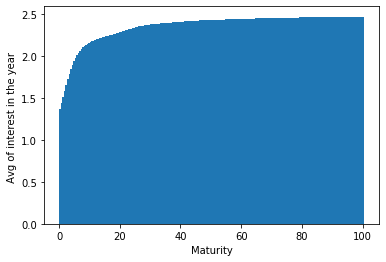

In [10]:
plt.bar(mat,l1)
plt.xlabel("Maturity")
plt.ylabel(" Avg of interest in the year  ")
plt.show()

Saturation point hence recieved is : ---> 25 weeks

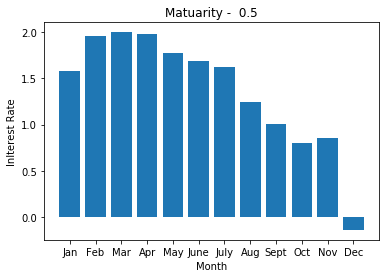

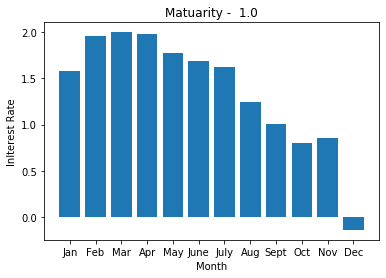

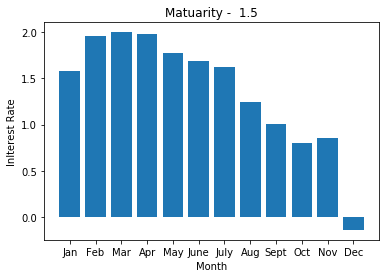

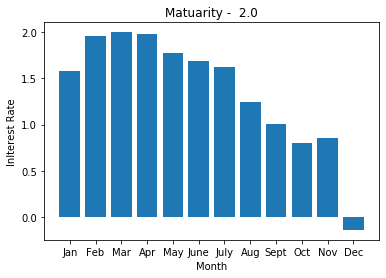

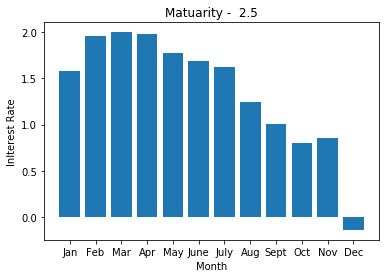

...

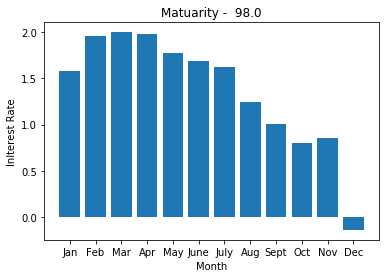

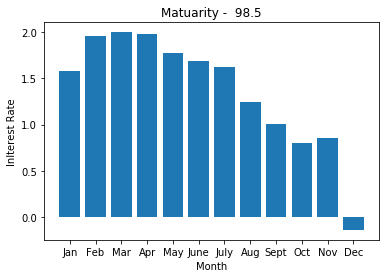

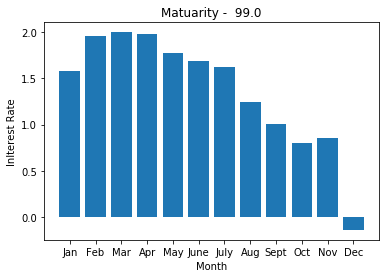

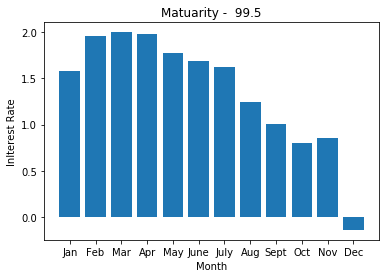

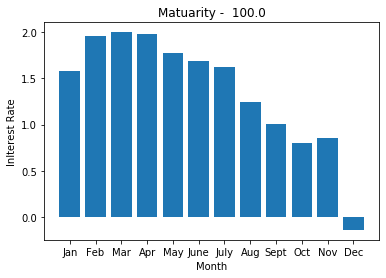

In [11]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.bar(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

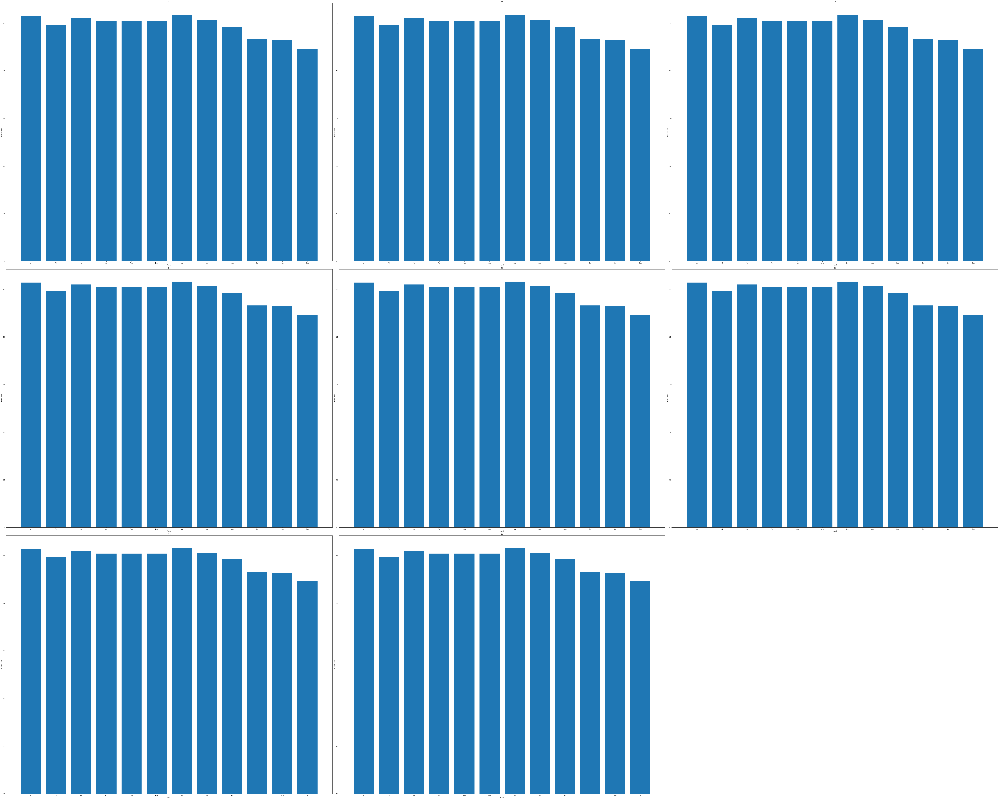

In [12]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,80))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.bar(name , l)
    ax.set_xlabel("Month")
    ax.set_ylabel("Inlterest Rate")
    ax.set_title(c)

plt.tight_layout()
plt.show()

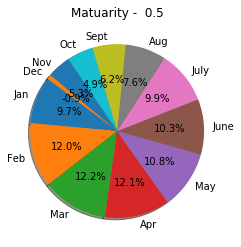

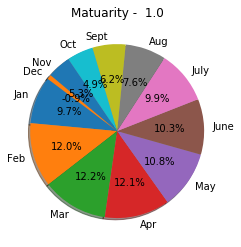

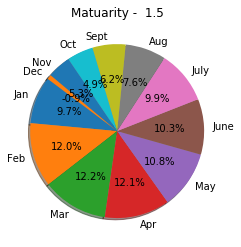

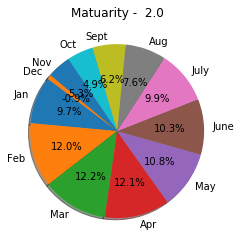

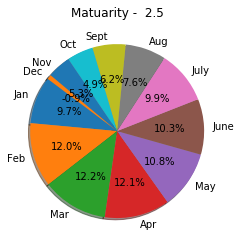

...

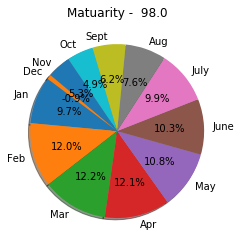

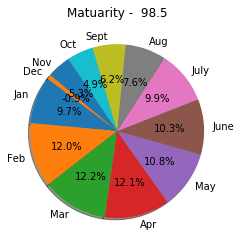

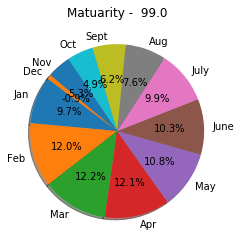

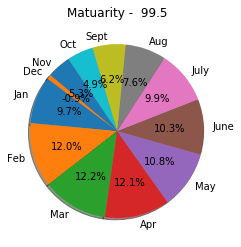

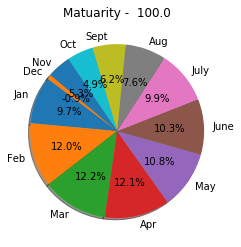

In [13]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.pie(l, labels=name, 
    autopct='%1.1f%%', shadow=True, startangle=140)
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()
   

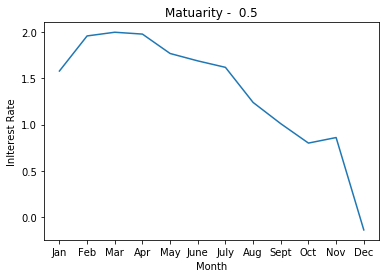

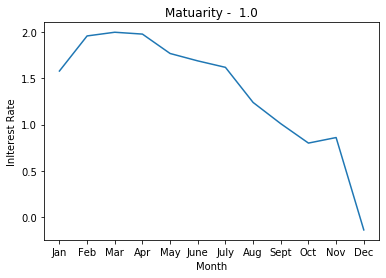

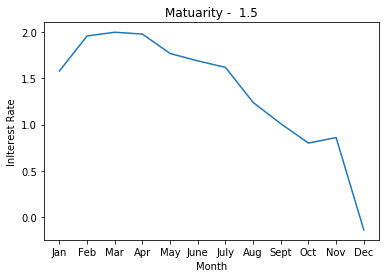

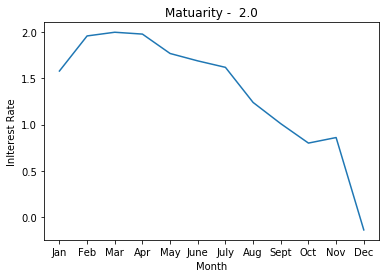

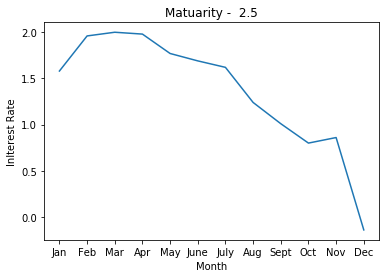

...

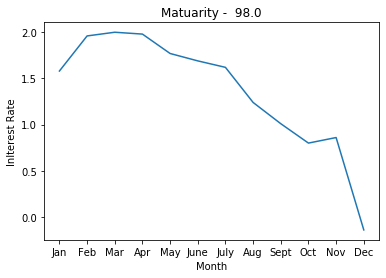

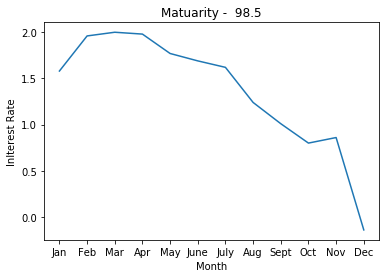

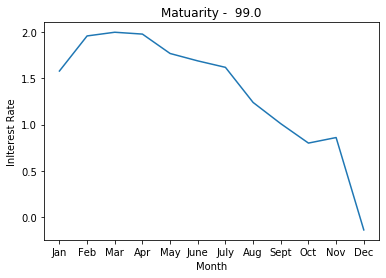

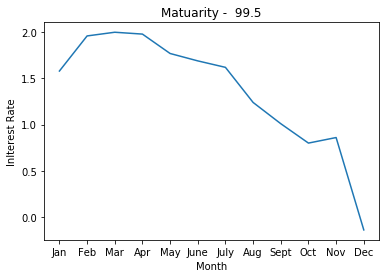

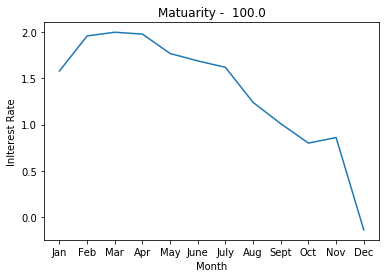

In [14]:
for i in range(0,len(df)):
    l = list(df.iloc[0,1:-1])
    plt.plot(name , l)
    plt.xlabel("Month")
    plt.ylabel("Inlterest Rate")
    plt.title("Matuarity -  "+str(df.iloc[i,0]))
    plt.show()

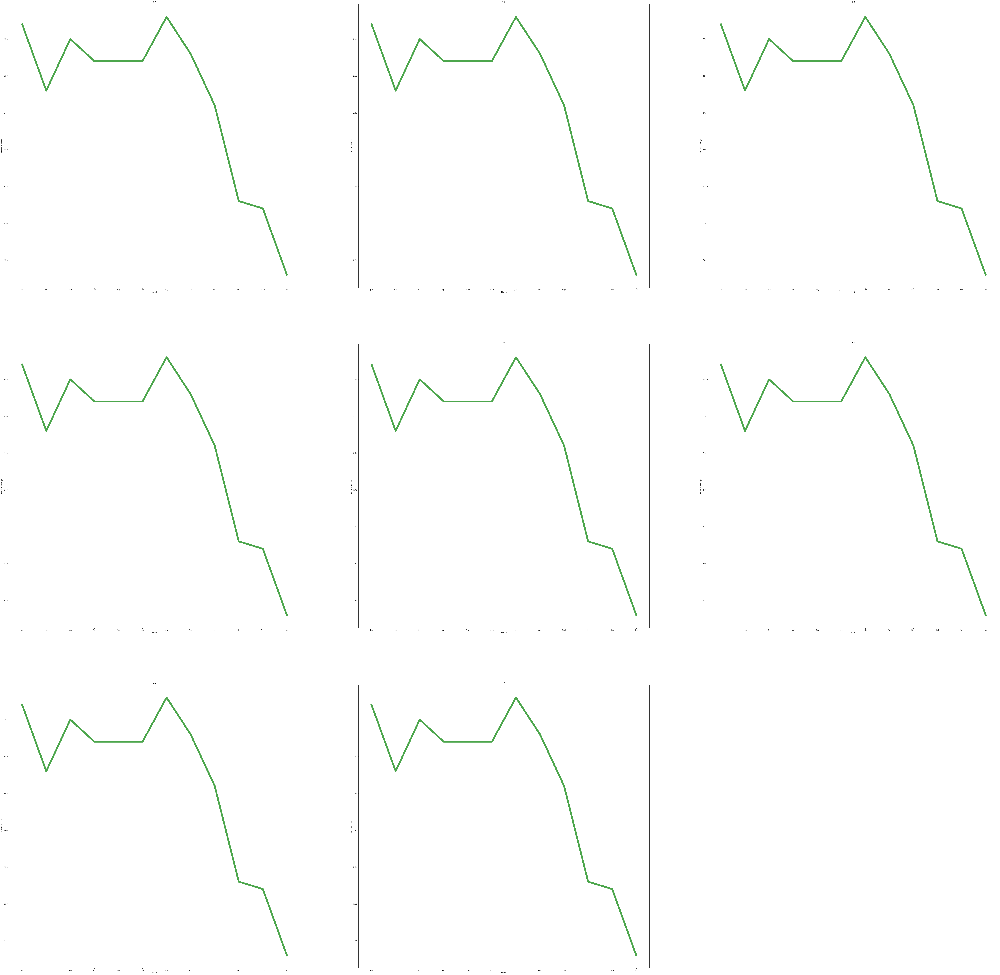

In [15]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(100,100))

for c,num in zip(mat, range(1,9)):
    df0=df[df['Matuarity']==c]
    l = list(df.iloc[i-1,1:-1])
    ax = fig.add_subplot(3,3,num)
    ax.plot(name, l ,color = 'g',linewidth=10, alpha=0.7 )
    ax.set_xlabel('Month')
    ax.set_ylabel('Interest average')
    ax.set_title(c)


plt.show()

In [16]:
avg_interest_among_all_matuarity = df['sum'].sum()/200

2.3534916666666668